### Insert tickers and quantity in this [Link](https://docs.google.com/spreadsheets/d/16MzJUZv6pTymiPAhTcfPk-GUAHPTU3l2ZQkOqZnDZEw/edit#gid=0)

In [1]:
import pandas as pd
from yahoo_fin.stock_info import get_data
from datetime import date
import numpy as np
import seaborn as sns
from datetime import date
from datetime import timedelta
import os
from io import BytesIO
import requests
from twilio.rest import Client
from dotenv import load_dotenv
import panel as pn
import subprocess
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px


In [2]:
#Copy MCForecastTools
Monte_Carlo_File = subprocess.run(["ls", "MCForecastTools.py"]).returncode
if Monte_Carlo_File == 2:
  !wget https://raw.githubusercontent.com/Lucas-Shaiman/project_alpha/main/MCForecastTools.py
from MCForecastTools import MCSimulation

ModuleNotFoundError: No module named 'MCForecastTools'

In [3]:


#Open Google Sheets and import Tickers and Asset Qauntity
r = requests.get('https://docs.google.com/spreadsheet/ccc?key=16MzJUZv6pTymiPAhTcfPk-GUAHPTU3l2ZQkOqZnDZEw&output=csv')
data = r.content
    
stocks = pd.read_csv(BytesIO(data), index_col=0)
stocks

,Quantity
Tickers,
AAPL,1
SPY,1
GOOG,1
TSM,1
NVDA,1
MSFT,1
T,1
VZ,1
TMUS,1


In [4]:
combined_df = pd.DataFrame()
for i in stocks.index:
  combined_df[i]= get_data(i)['close']
combined_df.tail()

,AAPL,SPY,GOOG,TSM,NVDA,MSFT,T,VZ,TMUS,PYPL,VGT,AMZN,IBM,NFLX
2021-06-25,133.110001,426.609985,2539.899902,116.529999,761.239990,265.019989,28.889999,56.380001,145.339996,289.600006,393.049988,3401.459961,146.839996,527.070007
2021-06-28,134.779999,427.470001,2536.389893,119.610001,799.400024,268.720001,28.780001,56.180000,145.039993,293.649994,397.239990,3443.889893,145.289993,533.030029
2021-06-29,136.330002,427.700012,2520.370117,120.230003,801.070007,271.399994,28.660000,55.840000,144.990005,292.760010,400.079987,3448.139893,145.550003,533.500000
2021-06-30,136.960007,428.059998,2506.320068,120.160004,800.099976,270.899994,28.780001,56.029999,144.830002,291.480011,398.769989,3440.159912,146.589996,528.210022
2021-07-01,137.270004,430.429993,2527.370117,118.419998,808.479980,271.600006,29.110001,56.290001,145.339996,289.000000,398.899994,3432.969971,146.839996,533.539978


In [5]:
combined_df.index = pd.to_datetime(combined_df.index)
combined_df.dropna(inplace= True)
combined_df.head()

,AAPL,SPY,GOOG,TSM,NVDA,MSFT,T,VZ,TMUS,PYPL,VGT,AMZN,IBM,NFLX
2015-07-06,31.500000,206.720001,522.859985,22.940001,20.170000,44.389999,35.610001,47.040001,38.549999,36.709999,106.449997,436.040009,164.729996,94.571426
2015-07-07,31.422501,208.020004,525.020020,22.959999,19.790001,44.299999,35.770000,47.250000,38.680000,36.619999,106.470001,436.720001,165.000000,94.091431
2015-07-08,30.642500,204.529999,516.830017,22.230000,19.650000,44.240002,34.790001,46.580002,38.470001,34.700001,104.669998,429.700012,163.160004,93.507141
2015-07-09,30.017500,204.899994,520.679993,22.219999,19.410000,44.520000,34.389999,46.259998,38.770000,34.500000,104.440002,434.390015,163.850006,95.727142
2015-07-10,30.820000,207.479996,530.130005,22.570000,19.750000,44.610001,34.650002,47.000000,39.029999,34.689999,105.989998,443.510010,166.949997,97.228569


In [ ]:
combined_df_price = combined_df

In [ ]:
combined_df.isnull().sum()

In [ ]:
combined_pct = combined_df.pct_change()
combined_pct.head()

In [34]:
combined_pct.dropna(inplace= True)
combined_pct.head()

,AAPL,SPY,GOOG,TSM,NVDA,MSFT,T,VZ,TMUS,PYPL
2015-07-07,-0.002460,0.006289,0.004131,0.000872,-0.018840,-0.002027,0.004493,0.004464,0.003372,-0.002452
2015-07-08,-0.024823,-0.016777,-0.015599,-0.031794,-0.007074,-0.001354,-0.027397,-0.014180,-0.005429,-0.052430
2015-07-09,-0.020397,0.001809,0.007449,-0.000450,-0.012214,0.006329,-0.011498,-0.006870,0.007798,-0.005764
2015-07-10,0.026734,0.012592,0.018149,0.015752,0.017517,0.002022,0.007560,0.015997,0.006706,0.005507
2015-07-13,0.019306,0.011037,0.030974,0.012849,0.006582,0.020847,0.006638,0.004255,0.005893,0.060248


In [35]:
stocks_list = stocks.index.tolist()

In [36]:
combined_pct[stocks_list[0]+' Lag'] = combined_pct[stocks_list[0]].shift()
combined_pct = combined_pct.dropna()

In [37]:
combined_pct.head()

,AAPL,SPY,GOOG,TSM,NVDA,MSFT,T,VZ,TMUS,PYPL,AAPL Lag
2015-07-08,-0.024823,-0.016777,-0.015599,-0.031794,-0.007074,-0.001354,-0.027397,-0.014180,-0.005429,-0.052430,-0.002460
2015-07-09,-0.020397,0.001809,0.007449,-0.000450,-0.012214,0.006329,-0.011498,-0.006870,0.007798,-0.005764,-0.024823
2015-07-10,0.026734,0.012592,0.018149,0.015752,0.017517,0.002022,0.007560,0.015997,0.006706,0.005507,-0.020397
2015-07-13,0.019306,0.011037,0.030974,0.012849,0.006582,0.020847,0.006638,0.004255,0.005893,0.060248,0.026734
2015-07-14,-0.000398,0.004338,0.026622,-0.002625,0.000503,0.001757,0.006881,0.004449,0.004585,0.004078,0.019306


In [38]:
def window_data(df, window, feature_col_number, target_col_number):
    """
    This function accepts the column number for the features (X) and the target (y).
    It chunks the data up with a rolling window of Xt - window to predict Xt.
    It returns two numpy arrays of X and y.
    """
    X = []
    y = []
    for i in range(len(df) - window):
        features = df.iloc[i : (i + window), feature_col_number]
        target = df.iloc[(i + window), target_col_number]
        X.append(features)
        y.append(target)
    return np.array(X), np.array(y).reshape(-1, 1)

In [39]:
# Creating the features (X) and target (y) data using the window_data() function.
window_size = 5

feature_column = 0
target_column = 0
X, y = window_data(combined_df_price, window_size, feature_column, target_column)
print (f"X sample values:\n{X[:5]} \n")
print (f"y sample values:\n{y[:5]}")

X sample values:
[[31.5        31.42250061 30.64249992 30.01749992 30.81999969]
 [31.42250061 30.64249992 30.01749992 30.81999969 31.41500092]
 [30.64249992 30.01749992 30.81999969 31.41500092 31.40250015]
 [30.01749992 30.81999969 31.41500092 31.40250015 31.70499992]
 [30.81999969 31.41500092 31.40250015 31.70499992 32.12749863]] 

y sample values:
[[31.41500092]
 [31.40250015]
 [31.70499992]
 [32.12749863]
 [32.40499878]]


In [40]:
# Use 70% of the data for training and the remainder for testing
split = int(0.7 * len(X))
X_train = X[: split]
X_test = X[split:]
y_train = y[: split]
y_test = y[split:]

In [41]:
# Use the MinMaxScaler to scale data between 0 and 1.
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
scaler.fit(y)
y_train = scaler.transform(y_train)
y_test = scaler.transform(y_test)

In [42]:
# Reshape the features for the model
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
print (f"X_train sample values:\n{X_train[:5]} \n")
print (f"X_test sample values:\n{X_test[:5]}")


X_train sample values:
[[[0.07393739]
  [0.07329464]
  [0.06682563]
  [0.06164214]
  [0.06829774]]

 [[0.07329464]
  [0.06682563]
  [0.06164214]
  [0.06829774]
  [0.07323244]]

 [[0.06682563]
  [0.06164214]
  [0.06829774]
  [0.07323244]
  [0.07312876]]

 [[0.06164214]
  [0.06829774]
  [0.07323244]
  [0.07312876]
  [0.07563757]]

 [[0.06829774]
  [0.07323244]
  [0.07312876]
  [0.07563757]
  [0.07914161]]] 

X_test sample values:
[[[0.2619946 ]
  [0.27628031]
  [0.27524361]
  [0.26624507]
  [0.26862947]]

 [[0.27628031]
  [0.27524361]
  [0.26624507]
  [0.26862947]
  [0.27028819]]

 [[0.27524361]
  [0.26624507]
  [0.26862947]
  [0.27028819]
  [0.27458014]]

 [[0.26624507]
  [0.26862947]
  [0.27028819]
  [0.27458014]
  [0.2708273 ]]

 [[0.26862947]
  [0.27028819]
  [0.27458014]
  [0.2708273 ]
  [0.2641302 ]]]


In [43]:
# Import required Keras modules
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

In [44]:
# Define the LSTM RNN model.
model = Sequential()

number_units = 5
dropout_fraction = 0.2

# Layer 1
model.add(LSTM(
    units=number_units,
    return_sequences=True,
    input_shape=(X_train.shape[1], 1))
    )
model.add(Dropout(dropout_fraction))
# Layer 2
model.add(LSTM(units=number_units, return_sequences=True))
model.add(Dropout(dropout_fraction))
# Layer 3
model.add(LSTM(units=number_units))
model.add(Dropout(dropout_fraction))
# Output layer
model.add(Dense(1))

In [45]:
# Compile the model
model.compile(optimizer="adam", loss="mean_squared_error")

In [46]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 5, 5)              140       
_________________________________________________________________
dropout (Dropout)            (None, 5, 5)              0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 5, 5)              220       
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 5)              0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 5)                 220       
_________________________________________________________________
dropout_2 (Dropout)          (None, 5)                 0         
_________________________________________________________________
dense (Dense)                (None, 1)                 6

In [47]:
# Train the model
model.fit(X_train, y_train, epochs=10, shuffle=False, batch_size=1, verbose=1)

Epoch 1/10
1053/1053 [==============================] - 9s 5ms/step - loss: 3.9769e-04
Epoch 2/10
1053/1053 [==============================] - 5s 5ms/step - loss: 7.1136e-04
Epoch 3/10
1053/1053 [==============================] - 5s 5ms/step - loss: 8.8068e-04
Epoch 4/10
1053/1053 [==============================] - 5s 4ms/step - loss: 0.0010
Epoch 5/10
1053/1053 [==============================] - 5s 5ms/step - loss: 0.0010
Epoch 6/10
1053/1053 [==============================] - 4s 4ms/step - loss: 0.0012
Epoch 7/10
1053/1053 [==============================] - 5s 5ms/step - loss: 0.0012
Epoch 8/10
1053/1053 [==============================] - 5s 5ms/step - loss: 0.0011
Epoch 9/10
1053/1053 [==============================] - 4s 4ms/step - loss: 0.0013
Epoch 10/10
1053/1053 [==============================] - 5s 5ms/step - loss: 0.0013


In [48]:
# Evaluate the model
model.evaluate(X_test, y_test)

15/15 [==============================] - 1s 2ms/step - loss: 0.2101


0.210077702999115

In [49]:
# Make some predictions
predicted = model.predict(X_test)

In [50]:
# Recover the original prices instead of the scaled version
predicted_prices = scaler.inverse_transform(predicted)
real_prices = scaler.inverse_transform(y_test.reshape(-1, 1))

In [51]:
# Create a DataFrame of Real and Predicted values
stocks_predict = pd.DataFrame({
    "Real": real_prices.ravel(),
    "Predicted": predicted_prices.ravel()
    }, index = combined_df_price.index[-len(real_prices): ])
stocks_predict.head()

,Real,Predicted
2019-09-17,55.174999,51.179985
2019-09-18,55.692501,51.180332
2019-09-19,55.240002,51.180103
2019-09-20,54.432499,51.180004
2019-09-23,54.680000,51.180027


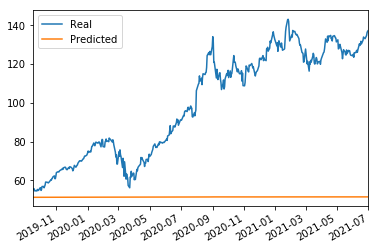

In [52]:
# Plot the real vs predicted prices as a line chart
stocks_predict.plot()

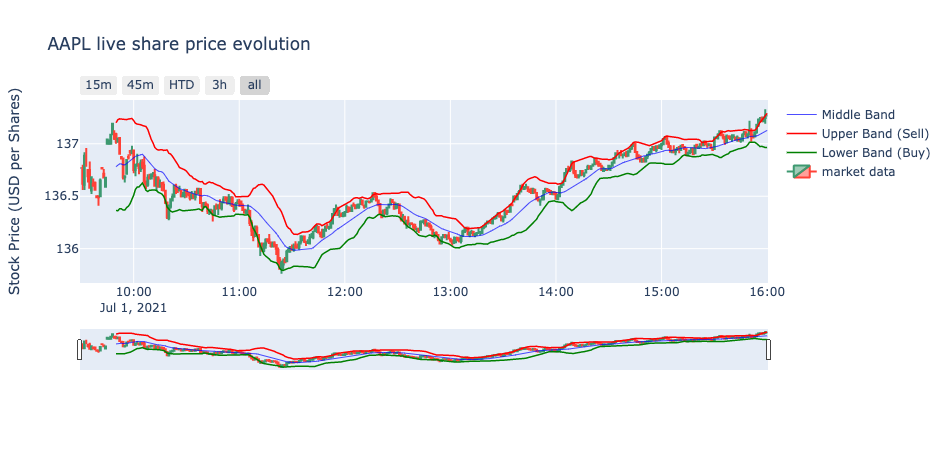

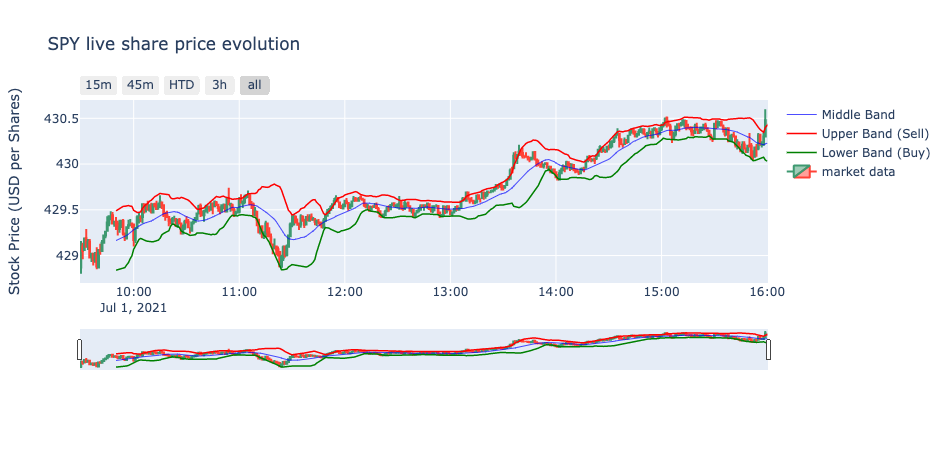

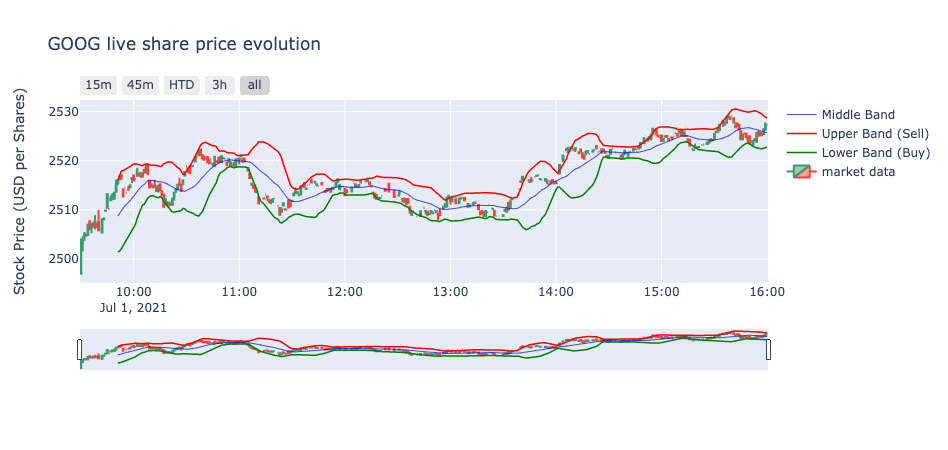

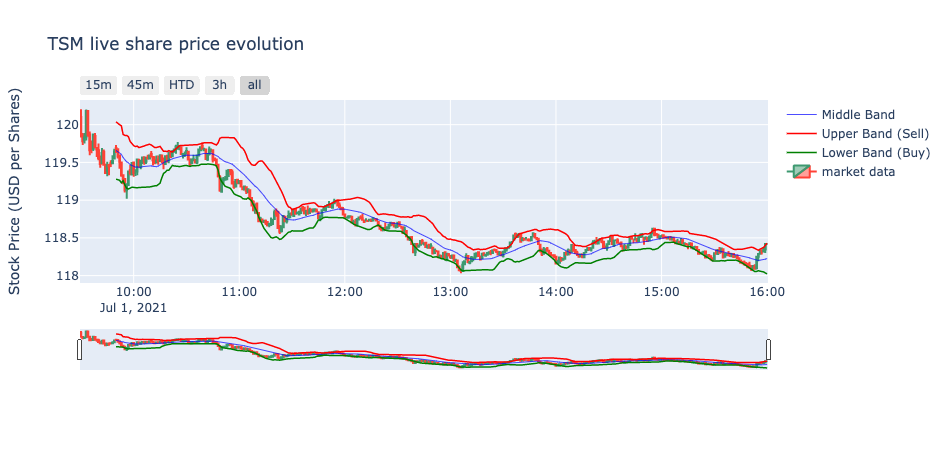

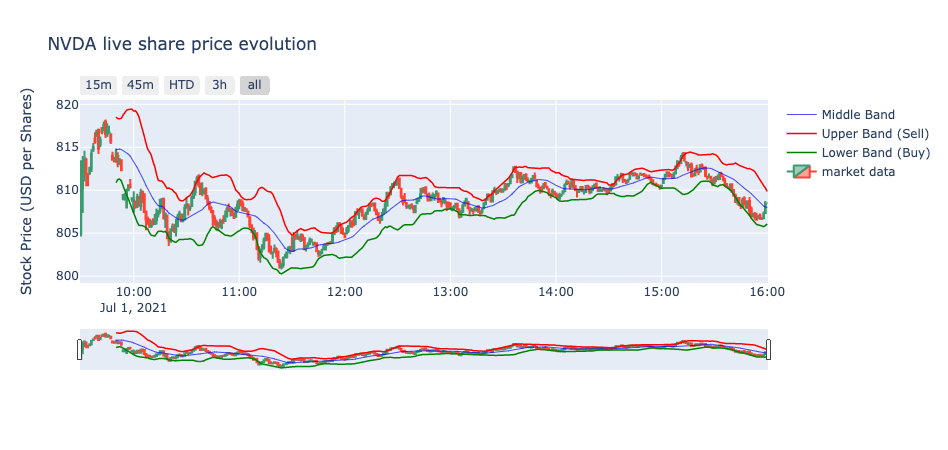

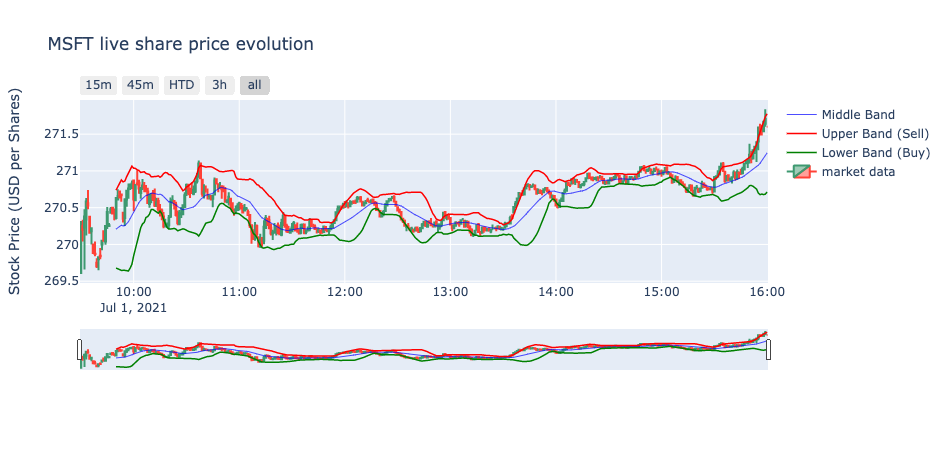

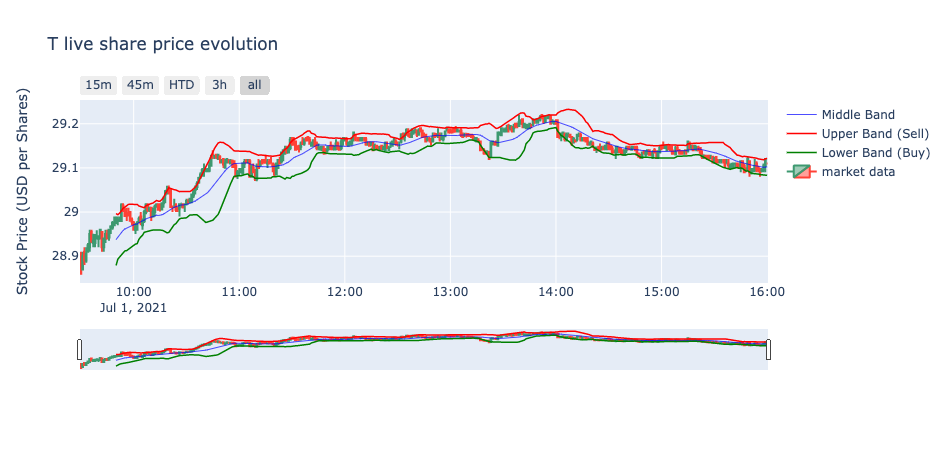

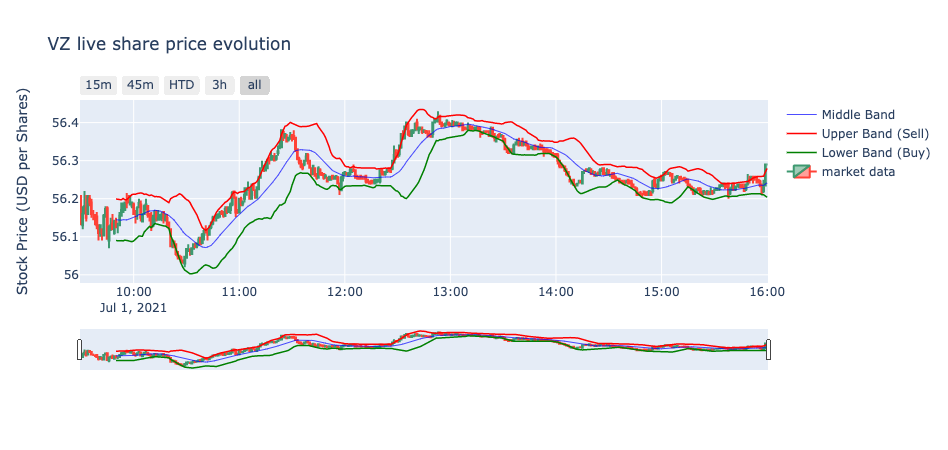

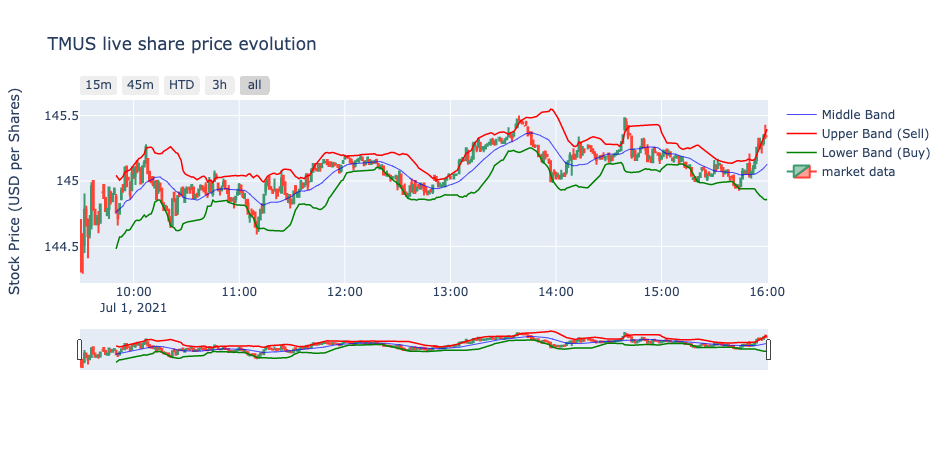

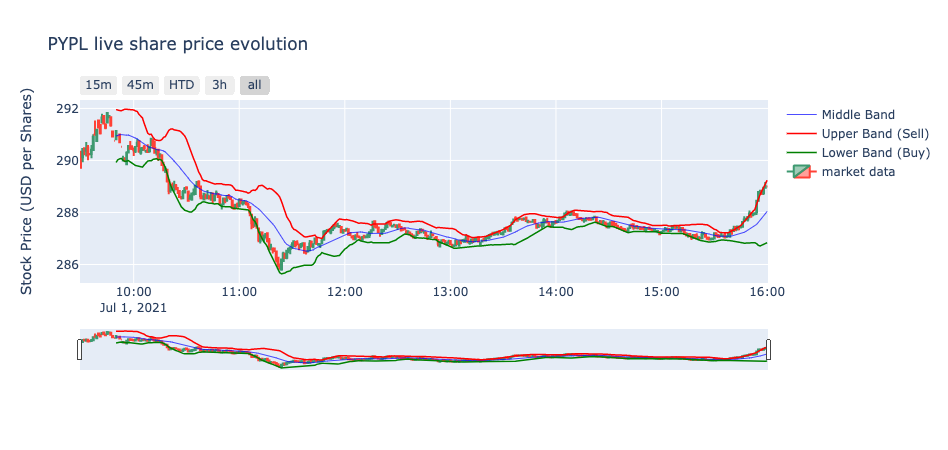

In [53]:

#Data Source
import yfinance as yf
def bolinger(stocks_intraday,period,interval):
    

    data = yf.download(tickers=stocks_intraday, period=period, interval=interval,progress=False)
    #Interval required 1 minute
    data['Middle Band'] = data['Close'].rolling(window=21).mean()
    data['Upper Band'] = data['Middle Band'] + 1.96*data['Close'].rolling(window=21).std()
    data['Lower Band'] = data['Middle Band'] - 1.96*data['Close'].rolling(window=21).std()

    #declare figure
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=data.index, y= data['Middle Band'],line=dict(color='blue', width=.7), name = 'Middle Band'))
    fig.add_trace(go.Scatter(x=data.index, y= data['Upper Band'],line=dict(color='red', width=1.5), name = 'Upper Band (Sell)'))
    fig.add_trace(go.Scatter(x=data.index, y= data['Lower Band'],line=dict(color='green', width=1.5), name = 'Lower Band (Buy)'))


    #Candlestick
    fig.add_trace(go.Candlestick(x=data.index,
                    open=data['Open'],
                    high=data['High'],
                    low=data['Low'],
                    close=data['Close'], name = 'market data'))

    # Add titles
    fig.update_layout(
        title=stocks_intraday + ' live share price evolution',
        yaxis_title='Stock Price (USD per Shares)')

    # X-Axes
    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=15, label="15m", step="minute", stepmode="backward"),
                dict(count=45, label="45m", step="minute", stepmode="backward"),
                dict(count=1, label="HTD", step="hour", stepmode="todate"),
                dict(count=3, label="3h", step="hour", stepmode="backward"),
                dict(step="all")
            ])
        )
    )

    return fig.show()
for i in stocks_list:
    bolinger(i,"1d","1m")

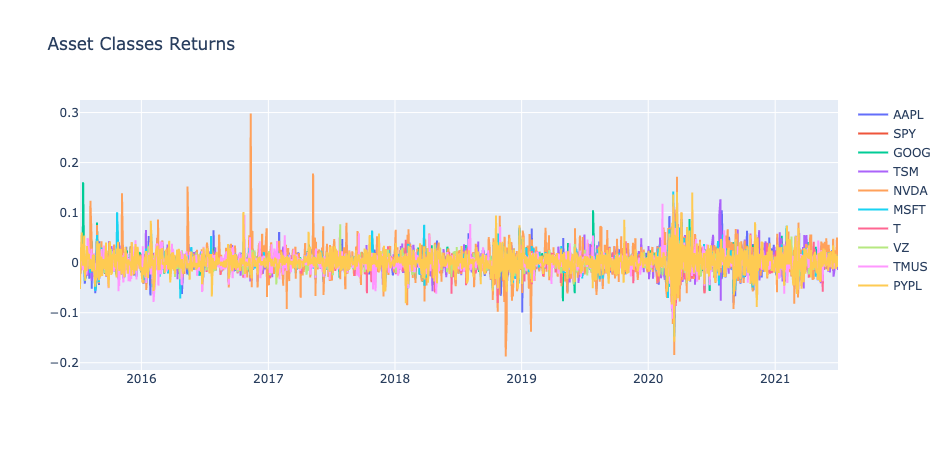

In [54]:

def combined_pct_plotly():
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=combined_pct.index, y=combined_pct[i],mode='lines',name=i)) 
  fig.update_layout(title="Asset Classes Returns")
  # fig.show()
  return fig
combined_pct_plotly()

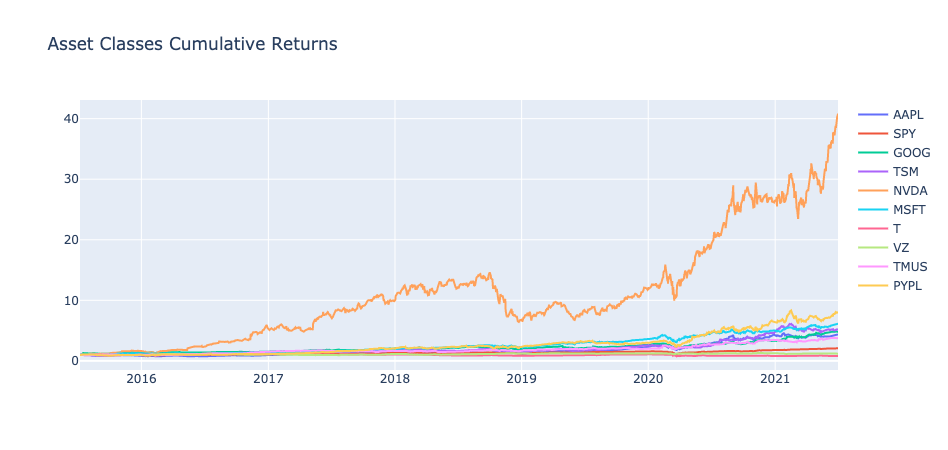

In [55]:
cumulative_returns_assets = (1 + combined_pct).cumprod()
def cumulative_returns_assets_plot():
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=cumulative_returns_assets.index, y=cumulative_returns_assets[i],mode='lines',name=i))
  fig.update_layout(title="Asset Classes Cumulative Returns")
  # fig.show()
  return fig

cumulative_returns_assets_plot()

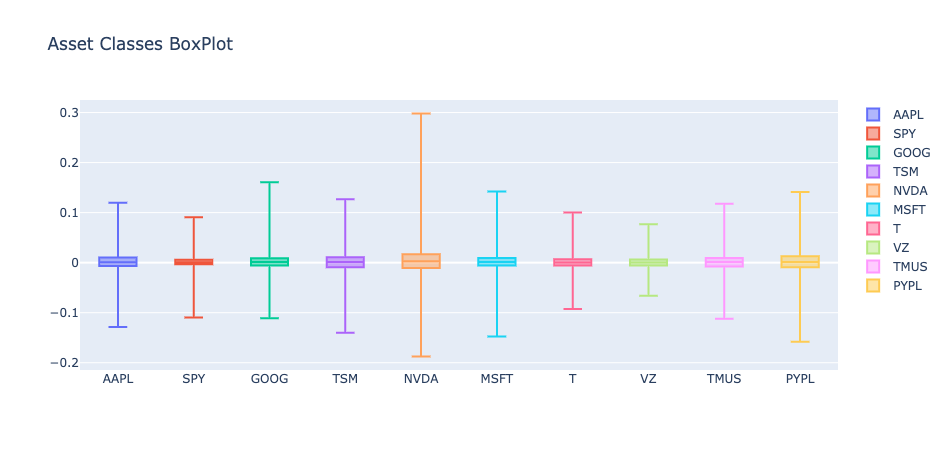

In [56]:


def combined_pct_boxplotly():
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Box(y=combined_pct[i], name=i, boxpoints=False))
  fig.update_layout(title="Asset Classes BoxPlot")
  # fig.show()
  return fig
combined_pct_boxplotly()

In [57]:
volatility_daily = combined_pct.std()
volatility_daily

AAPL        0.018889
SPY         0.011667
GOOG        0.017261
TSM         0.018867
NVDA        0.029276
MSFT        0.017264
T           0.014196
VZ          0.011911
TMUS        0.017854
PYPL        0.021833
AAPL Lag    0.018889
dtype: float64

In [58]:
volatility_annualy = combined_pct.std() * np.sqrt(252)
volatility_annualy

AAPL        0.299848
SPY         0.185201
GOOG        0.274006
TSM         0.299505
NVDA        0.464738
MSFT        0.274053
T           0.225360
VZ          0.189084
TMUS        0.283416
PYPL        0.346581
AAPL Lag    0.299851
dtype: float64

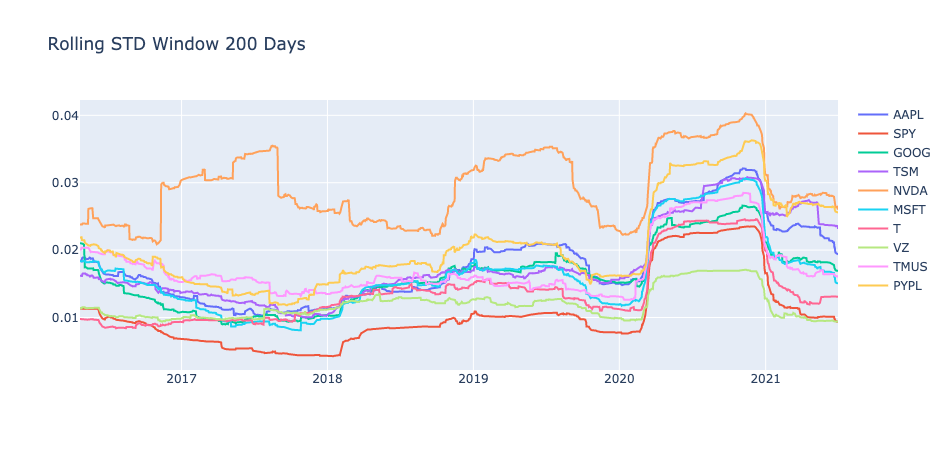

In [59]:
def rolling_std_plotly(d):
  a = combined_pct.rolling(window=d).std()[d:]
  rolling_title = "Rolling STD Window " + str(d) + " Days"
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=a.index, y=a[i],mode='lines',name=i))
  fig.update_layout(title=rolling_title)
  # fig.show()
  return fig
rolling_std_plotly(200)

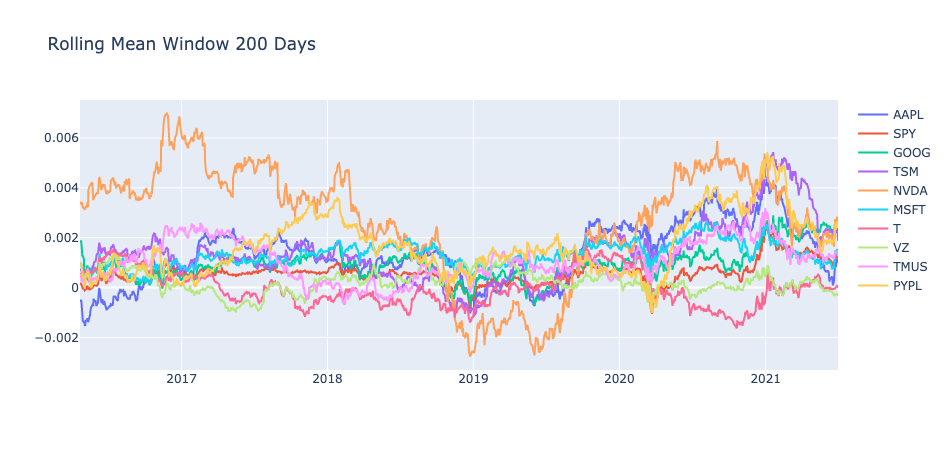

In [60]:
def rolling_mean_plotly(d):
  a = combined_pct.rolling(window=d).mean()[d:]
  rolling_title = "Rolling Mean Window " + str(d) + " Days"
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=a.index, y=a[i],mode='lines',name=i))
  fig.update_layout(title=rolling_title)
  # fig.show()
  return fig
rolling_mean_plotly(200)

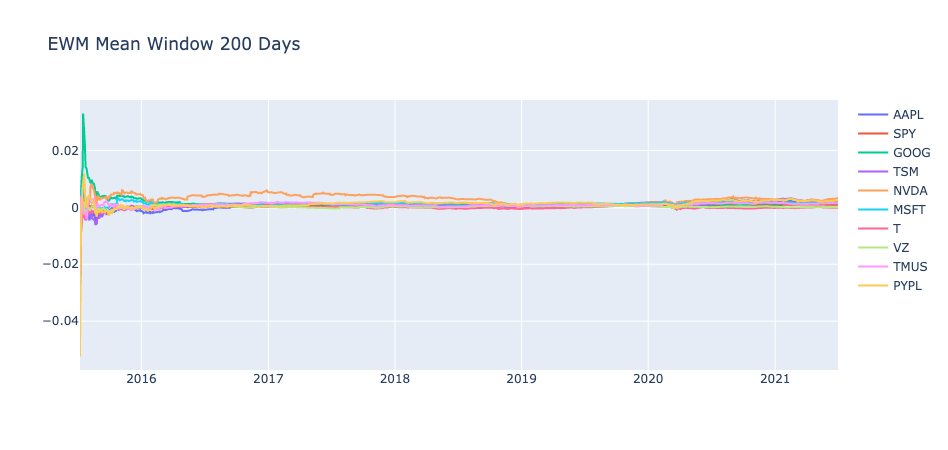

In [61]:
def ewm(d):
  ewm_calc = combined_pct.ewm(halflife=d).mean()
  title_EWM = "EWM Mean Window " + str(d) + " Days"
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=ewm_calc.index, y=ewm_calc[i],mode='lines',name=i))
  fig.update_layout(title=title_EWM)
  # fig.show()
  return fig
ewm(200)



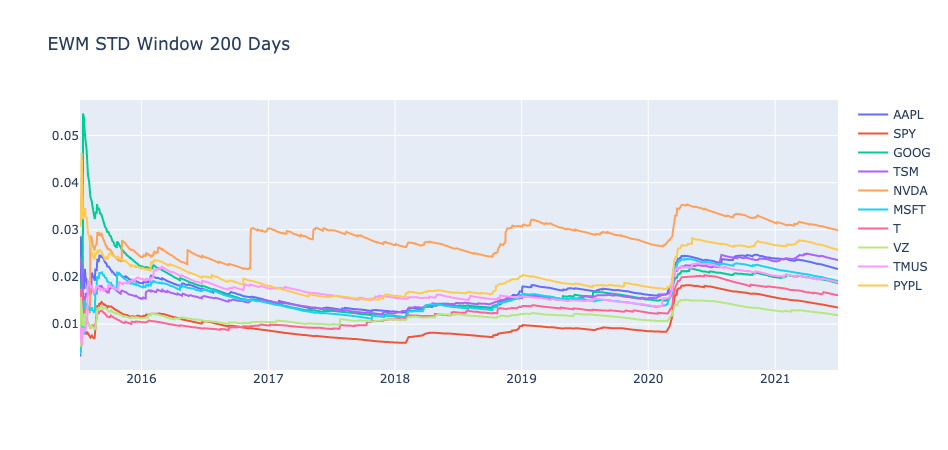

In [62]:
def ewm(d):
  ewm_calc = combined_pct.ewm(halflife=d).std()
  title_EWM = "EWM STD Window " + str(d) + " Days"
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Scatter(x=ewm_calc.index, y=ewm_calc[i],mode='lines',name=i))
  fig.update_layout(title=title_EWM)
  # fig.show()
  return fig
ewm(200)

In [63]:
# Calculate the correlation
price_correlation = combined_pct.corr()
# Display de correlation matrix
price_correlation

,AAPL,SPY,GOOG,TSM,NVDA,MSFT,T,VZ,TMUS,PYPL,AAPL Lag
AAPL,1.000000,0.743306,0.614850,0.552189,0.555026,0.705347,0.343231,0.270179,0.420734,0.588868,-0.104973
SPY,0.743306,1.000000,0.732752,0.627640,0.604491,0.815004,0.597539,0.504990,0.584108,0.667576,-0.152169
GOOG,0.614850,0.732752,1.000000,0.500380,0.522492,0.741616,0.349832,0.290954,0.461074,0.585359,-0.118399
TSM,0.552189,0.627640,0.500380,1.000000,0.547782,0.565135,0.283337,0.224029,0.349134,0.503490,-0.176080
NVDA,0.555026,0.604491,0.522492,0.547782,1.000000,0.602829,0.237893,0.187994,0.402283,0.534343,-0.140724
MSFT,0.705347,0.815004,0.741616,0.565135,0.602829,1.000000,0.375064,0.361974,0.519265,0.675523,-0.162847
T,0.343231,0.597539,0.349832,0.283337,0.237893,0.375064,1.000000,0.667941,0.400324,0.232540,-0.074126
VZ,0.270179,0.504990,0.290954,0.224029,0.187994,0.361974,0.667941,1.000000,0.384653,0.209879,-0.081733
TMUS,0.420734,0.584108,0.461074,0.349134,0.402283,0.519265,0.400324,0.384653,1.000000,0.447136,-0.096394
PYPL,0.588868,0.667576,0.585359,0.503490,0.534343,0.675523,0.232540,0.209879,0.447136,1.000000,-0.135629


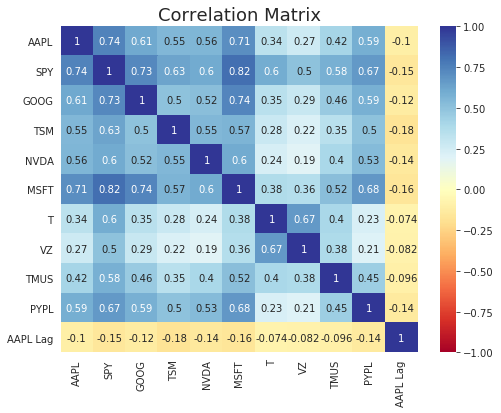

In [64]:
def matrix():
  with sns.axes_style("white"):
      ax = plt.subplots(figsize=(8, 6))
      ax = plt.title('Correlation Matrix',fontsize=18)
      ax = sns.heatmap(price_correlation, vmax=1,vmin=-1,annot=True,cmap="RdYlBu")
      fig = plt.figure()
      plt.close()
  return 
matrix()


In [65]:
# Annualized Sharpe Ratios
sharpe_ratios = (combined_pct.mean() * 252) / (combined_pct.std() * np.sqrt(252))

In [41]:
sharpe_ratios

GOOG        0.900714
SPY         0.512632
GOLD        0.216882
GOOG Lag    0.915526
dtype: float64

In [42]:
sharpe_ratios.index.values

array(['GOOG', 'SPY', 'GOLD', 'GOOG Lag'], dtype=object)

In [43]:
sharpe_ratios.values

array([0.90071384, 0.51263222, 0.21688248, 0.91552631])

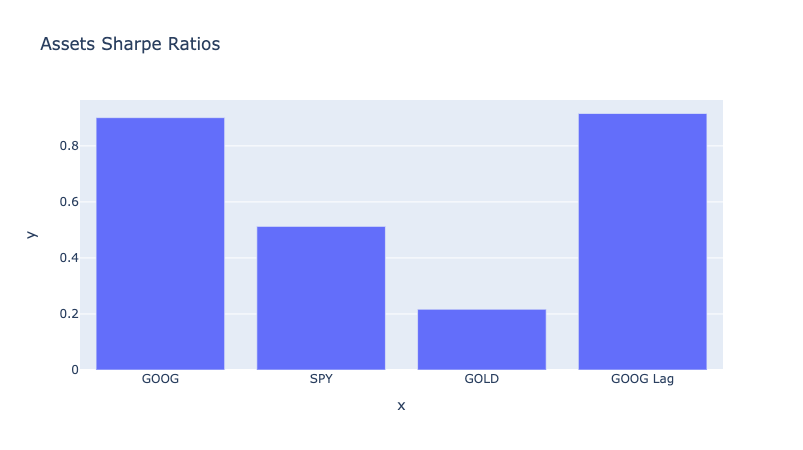

In [44]:
def sharpe_plotly():
  fig = px.bar(data_frame =sharpe_ratios,x = sharpe_ratios.index.values, y = sharpe_ratios.values,title="Assets Sharpe Ratios")
  # fig.show()
  return fig
sharpe_plotly()

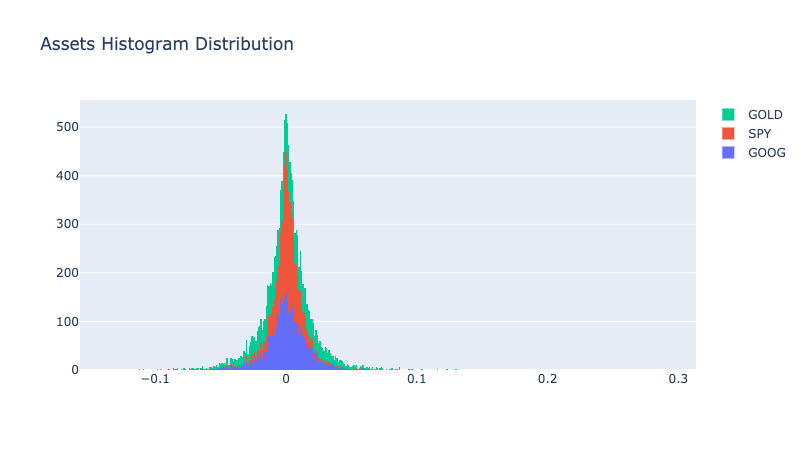

In [45]:
import plotly.graph_objects as go


def Asset_hist_plotly():
  fig = go.Figure()
  for i in stocks.index:
    fig.add_trace(go.Histogram(x=combined_pct[i],name=i,autobinx=True))
  fig.update_layout(title={'text': "Assets Histogram Distribution"})

  # The two histograms are drawn on top of another
  fig.update_layout(barmode='stack')
  # fig.show()
  return fig
Asset_hist_plotly()

In [46]:
#Efficient Frontier
# Calculate annualized average return for each stock. Annualized average return = Daily average return * 252 business days.
r = np.mean(combined_pct,axis=0)*252
# Create a covariance matrix
covar = combined_pct.cov()


In [47]:
#Define frequently used functions.
# r is each stock's return, w is the portion of each stock in our portfolio, and covar is the covariance matrix
# Rate of return
def ret(r,w):
    return r.dot(w)
# Risk level - or volatility
def vol(w,covar):
    return np.sqrt(np.dot(w,np.dot(w,covar)))
def sharpe (ret,vol):
    return ret/vol

In [48]:
# All weights, of course, must be between 0 and 1. Thus we set 0 and 1 as the boundaries.
from scipy.optimize import Bounds
bounds = Bounds(0, 1)

# The second boundary is the sum of weights.
from scipy.optimize import LinearConstraint
linear_constraint = LinearConstraint(np.ones((combined_pct.shape[1],), dtype=int),1,1)

# Find a portfolio with the minimum risk.
from scipy.optimize import minimize
#Create x0, the first guess at the values of each stock's weight.
weights = np.ones(combined_pct.shape[1])
x0 = weights/np.sum(weights)
#Define a function to calculate volatility
fun1 = lambda w: np.sqrt(np.dot(w,np.dot(w,covar)))
res = minimize(fun1,x0,method='trust-constr',constraints = linear_constraint,bounds = bounds)

#These are the weights of the stocks in the portfolio with the lowest level of risk possible.
w_min = res.x

np.set_printoptions(suppress = True, precision=2)
print(w_min)
print('Minimize Risk Portfolio return: % .2f'% (ret(r,w_min)*100), 'risk: % .3f'% vol(w_min,covar))

[0.01 0.63 0.07 0.29]
Minimize Risk Portfolio return:  15.28 risk:  0.010


In [49]:
#Define 1/Sharpe_ratio
fun2 = lambda w: np.sqrt(np.dot(w,np.dot(w,covar)))/r.dot(w)
res_sharpe = minimize(fun2,x0,method='trust-constr',constraints = linear_constraint,bounds = bounds)

#These are the weights of the stocks in the portfolio with the highest Sharpe ratio.
w_sharpe = res_sharpe.x
print(w_sharpe)
print('Maximize Sharp Ratio Portfolio return: % .2f'% (ret(r,w_sharpe)*100), 'risk: % .3f'% vol(w_sharpe,covar))


[0.47 0.   0.05 0.48]
Maximize Sharp Ratio Portfolio return:  26.79 risk:  0.013


In [50]:
#Current Portfolio
stocks

,Quantity
Tickers,
GOOG,1
SPY,1
GOLD,1


In [51]:
last_day_price = combined_df.tail(1)
last_day_price

,GOOG,SPY,GOLD
2021-06-30,2506.320068,428.059998,20.68


In [52]:
last_day_price_list = last_day_price.values.tolist()[0]
last_day_price_list

[2506.320068359375, 428.05999755859375, 20.68000030517578]

In [53]:
stocks['Value']=last_day_price_list
stocks

,Quantity,Value
Tickers,,
GOOG,1,2506.320068
SPY,1,428.059998
GOLD,1,20.680000


In [54]:
stocks['Total']=stocks['Quantity'] * stocks['Value']
stocks

,Quantity,Value,Total
Tickers,,,
GOOG,1,2506.320068,2506.320068
SPY,1,428.059998,428.059998
GOLD,1,20.680000,20.680000


In [55]:
stocks['Percentage']=stocks['Total'] / stocks['Total'].sum()
stocks

,Quantity,Value,Total,Percentage
Tickers,,,,
GOOG,1,2506.320068,2506.320068,0.848145
SPY,1,428.059998,428.059998,0.144857
GOLD,1,20.680000,20.680000,0.006998


In [56]:
w_current = stocks['Percentage'].values.tolist()
w_current

[0.8481452194515616, 0.14485661474411118, 0.006998165804327234]

In [57]:
Min_Risk = combined_df.dot(w_min)
Min_Risk.dropna()


Max_Sharpe = combined_df.dot(w_sharpe)
Max_Sharpe.dropna()


Current = combined_df.dot(w_current)
Current.dropna()


ValueError: Dot product shape mismatch, (4246, 3) vs (4,)

In [ ]:
# Create daily returns of all portfolios
column = ['Portfolio Min. Risk', 'Portfolio Max. Sharpe', 'Portfolio Current']

combined_returns = pd.concat([Min_Risk, Max_Sharpe, Current], axis="columns", join="inner")
combined_returns.columns = column
combined_returns.dropna(inplace= True)
combined_returns.head()


In [ ]:
combined_returns_pct = combined_returns.pct_change()
combined_returns_pct.dropna(inplace= True)
combined_returns_pct.head()

In [ ]:
def combined_returns_pct_plotly():
  fig = go.Figure()
  for i in combined_returns_pct.columns:
    fig.add_trace(go.Scatter(x=combined_returns_pct.index, y=combined_returns_pct[i],mode='lines',name=i)) 
  fig.update_layout(title="Portfolio Daily Returns")
  # fig.show()
  return fig
combined_returns_pct_plotly()

In [ ]:
cumulative_returns = (1 + combined_returns_pct).cumprod()

In [ ]:
def cumulative_returns_plotly():
  fig = go.Figure()
  for i in cumulative_returns.columns:
    fig.add_trace(go.Scatter(x=cumulative_returns.index, y=cumulative_returns[i],mode='lines',name=i)) 
  fig.update_layout(title="Portfolio Cumulative Returns")
  # fig.show()
  return fig
cumulative_returns_plotly()



In [ ]:
combined_returns_pct


In [ ]:
sharpe_ratios_portf = (combined_returns_pct.mean() * 252) / (combined_returns_pct.std() * np.sqrt(252))

In [ ]:
sharpe_ratios_portf 

In [ ]:

def sharpe_ratios_portf_plt():
  fig = px.bar(data_frame =sharpe_ratios_portf ,x = sharpe_ratios_portf.index.values, y = sharpe_ratios_portf.values,title="Potfolio Sharpe Ratios")
  # fig.show()
  return fig
sharpe_ratios_portf_plt()

In [ ]:
Max_Sharpe_alocation = stocks['Total'].sum() * w_sharpe
Max_Sharpe_alocation

In [ ]:
stocks['Total']

In [ ]:
Max_Sharpe_alocation_list = Max_Sharpe_alocation.tolist()
Max_Sharpe_alocation_list

In [ ]:
stocks['Sharpe adj.'] = Max_Sharpe_alocation_list
stocks

In [ ]:
stocks['Future Order'] = stocks['Sharpe adj.'] - stocks['Total']
stocks

In [ ]:
monte_carlo_df = combined_df.dropna()
tickers_names = monte_carlo_df.columns.tolist()
tickers_names

In [ ]:
import itertools
close_name = list(itertools.repeat("close", len(tickers_names)))
close_name

In [ ]:
index_names = [
tickers_names,
close_name
]
index_tuples = list(zip(*index_names))
new_index = pd.MultiIndex.from_tuples(index_tuples,names=["first", "second"])
monte_carlo_df.columns = new_index

In [ ]:
monte_carlo_df.head()

In [ ]:
w_sharpe_round = np.round(w_sharpe, decimals=2)
w_sharpe_list = w_sharpe_round.tolist()


In [ ]:
mc_portfolio = MCSimulation(
    monte_carlo_df,
    weights = w_sharpe_list,
    num_simulation = 50,
    num_trading_days = 252*2
)

In [ ]:
monte_carlo_df

In [ ]:
mc_port_go = mc_portfolio.calc_cumulative_return()


In [ ]:

def mc_port_go_plot():
  fig = go.Figure()
  for i in mc_port_go.columns:
    fig.add_trace(go.Scatter(x=mc_port_go.index, y=mc_port_go[i],mode='lines',name=i)) 
  fig.update_layout(title="Portfolio Monte Carlo Returns 2Y")
  # fig.show()
  return fig
mc_port_go_plot()

In [ ]:

mc_trad_tbl_yr = mc_portfolio.summarize_cumulative_return()

print(mc_trad_tbl_yr)

In [ ]:
# Set initial investment
initial_investment = 1000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $1,000
ci_lower = round(mc_trad_tbl_yr[8]*initial_investment,2)
ci_upper = round(mc_trad_tbl_yr[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

In [ ]:
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import dash_bootstrap_components as dbc
# Load Data
df = px.data.tips()
# Build App
app = JupyterDash(__name__)


app.layout = html.Div([dcc.Tabs
  ([
      dcc.Tab(label='Stocks', children=[
      dcc.Graph(figure=Asset_hist_plotly()),
      dcc.Graph(figure=combined_pct_plotly()),
      dcc.Graph(figure=cumulative_returns_assets_plot()),
      dcc.Graph(figure=combined_pct_boxplotly()),
      dcc.Graph(figure=rolling_std_plotly(60)),
      dcc.Graph(figure=ewm(60)),
      dcc.Graph(figure=sharpe_plotly()),
      ]),

      dcc.Tab(label='Portfolio', children=[
      dcc.Graph(figure=combined_returns_pct_plotly()),
      dcc.Graph(figure=cumulative_returns_plotly()),
      dcc.Graph(figure=sharpe_ratios_portf_plt()),
      dcc.Graph(figure=mc_port_go_plot()),
      ]),

])
])
# Define callback to update graph

# Run app and display result inline in the notebook
app.run_server(mode='external')

In [ ]:
from pyngrok import ngrok
url = ngrok.connect(8050).public_url

In [ ]:
a = print(url)
a

In [ ]:
#Twilio password file
load_dotenv("twilio.env")
account_sid = os.getenv("account_sid_twilio")
auth_token = os.getenv("auth_token_twilio")
sender = os.getenv("sender_twilio")
bindings = os.getenv("bindings_twilio")
client = Client(account_sid, auth_token)

In [ ]:
stocks['Future Order'].iteritems()

In [ ]:
twilio_message1 = ''

for index, alocation in stocks['Future Order'].iteritems(): 
    if alocation > 0:  
        twilio_message1 = twilio_message1 + " " + f"{index} BUY " + "${:,.2f}".format(alocation) + "\n"
    elif alocation < 0:
        twilio_message1 = twilio_message1 + " " + f"{index} SELL " + "${:,.2f}".format(-1*alocation) + "\n"
    else:
        twilio_message1 = twilio_message1 + " " + f"{index} HOLD" + "\n"


twilio_message1


In [ ]:
print(twilio_message1)

In [ ]:
body = twilio_message1


message = client.messages.create(
                     body=body,            
                     from_= sender,
                     to =bindings
)
print(message.sid)